In [1]:
%cd /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/

/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection


In [ ]:
%cp -r skin_cancer_isic_augmented skin_cancer_isic

^C


In [2]:
!ls

skin_cancer_isic  skin_cancer_isic_augmented


In [ ]:
!unzip CNN_assignment.zip

unzip:  cannot find or open CNN_assignment.zip, CNN_assignment.zip.zip or CNN_assignment.zip.ZIP.


In [1]:
%cd /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented

/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented


In [2]:
root = '/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented'

In [3]:
import tensorflow as  tf
from tensorflow.keras import layers
from skimage import io
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

### Image Augmentation & Preprocessing :

#### Understanding Data

In [ ]:
cls_names = os.listdir("Train/")
print(f"There are {len(cls_names)} categories given of melanoma type")
print(f"name of different types : ")
cls_names

There are 9 categories given of melanoma type
name of different types : 


['actinic keratosis',
 'basal cell carcinoma',
 'dermatofibroma',
 'melanoma',
 'nevus',
 'pigmented benign keratosis',
 'seborrheic keratosis',
 'squamous cell carcinoma',
 'vascular lesion']

In [ ]:
def per_class_image_count() :
  ## class-wise count
  count_bin = []
  for cls in cls_names :
    count_bin.append(len(os.listdir(f"Train/{cls}/")))

  fig = plt.figure(figsize = (10, 5))
 
  # creating the bar plot
  plt.barh(cls_names,count_bin, color ='maroon')
  plt.ylabel("count")
  plt.show()


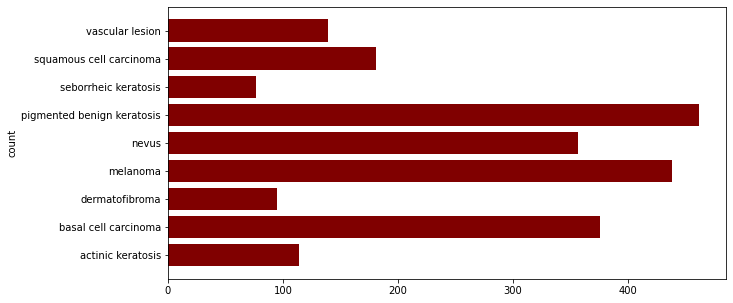

In [ ]:
per_class_image_count()

observation:

1. After looking Bar chart, we can say that datapoints are not eqally among different class.
2. Seborrheic keratosis contain very low numer of image and pigmented contain very high number of images.
2. Class imbalance strategy will be consindered while building model.

#### Viewing Image of each class

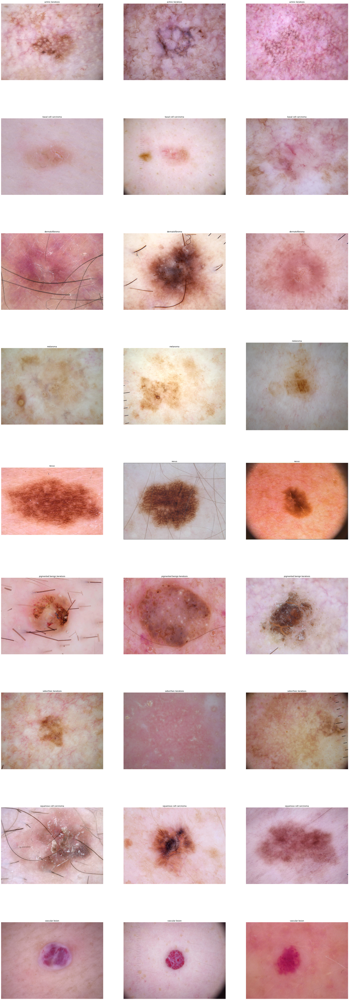

In [ ]:
# function for ploting image
no_of_image=3
fig_size=(40,120)
plt.figure(figsize = fig_size)
for i,cls in enumerate(cls_names) :
  list_files = os.listdir(f"Train/{cls}/")
  parent_path = os.path.join(f"Train/{cls}")
  for j in range(no_of_image) :
    file_nm = random.choice(list_files)
    img = io.imread(os.path.join(f"{parent_path}/{file_nm}"))
    plt.subplot(len(cls_names),no_of_image,(i*no_of_image+j+1))
    plt.imshow(img)
    plt.axis("off")
    plt.title(cls)

#### Image Size Distribution:

In [ ]:
# function to get height and width distribution of 
def img_sizes_distribution(path) :
  size=[]
  for img_path in glob.glob(path,recursive=True) :
    img = io.imread(img_path)
    size.append((img.shape[0],img.shape[1]))
  return size

In [ ]:
# calling function to get height and width then plot
img_sizes=img_sizes_distribution('Train/*/*')

In [ ]:

img_sizes=np.array(img_sizes)

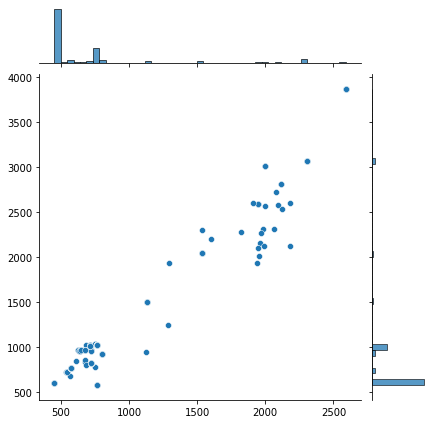

In [ ]:
# plotting
sns.jointplot(x=img_sizes[:,0],y=img_sizes[:,1])

observation:
1. Size of most of image lies in range (450,600).
2. Dataset also contains few images which having very large size varying from 1000 to 4000.

### Image Preprocessing 

In [4]:
IMG_SIZE=180
BATCH_SIZE=32
NUMBER_OF_CHANNEL=3
AUTOTUNE = tf.data.AUTOTUNE
class_names = ['actinic keratosis','basal cell carcinoma','dermatofibroma','melanoma','nevus','pigmented benign keratosis',
                 'seborrheic keratosis','squamous cell carcinoma','vascular lesion']

In [ ]:
# function to plot image of dataset generator
def image_plot(ds,class_names) :
  plt.figure(figsize=(10, 10))
  for images, labels in ds.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(f'{class_names[labels[i]]}-{images[i].shape}')
      plt.axis("off")

##### Image Generator (Train Set,Validation Set,Test Set)

In [ ]:
## train set
train_ds=tf.keras.utils.image_dataset_from_directory(
    directory=f"{root}/Train/",
    label_mode='int',
    class_names=class_names,
    color_mode='rgb',
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="training",
    interpolation='bilinear',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [ ]:
# validation set
val_ds=tf.keras.utils.image_dataset_from_directory(
    directory=f"{root}/Train/",
    label_mode='int',
    class_names=class_names,
    color_mode='rgb',
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="validation",
    interpolation='bilinear',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [ ]:
# test set
test_ds=tf.keras.utils.image_dataset_from_directory(
    directory=f"{root}/Test/",
    label_mode='int',
    class_names=class_names,
    color_mode='rgb',
    shuffle=False,
    seed=42,
    interpolation='bilinear',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

Found 118 files belonging to 9 classes.


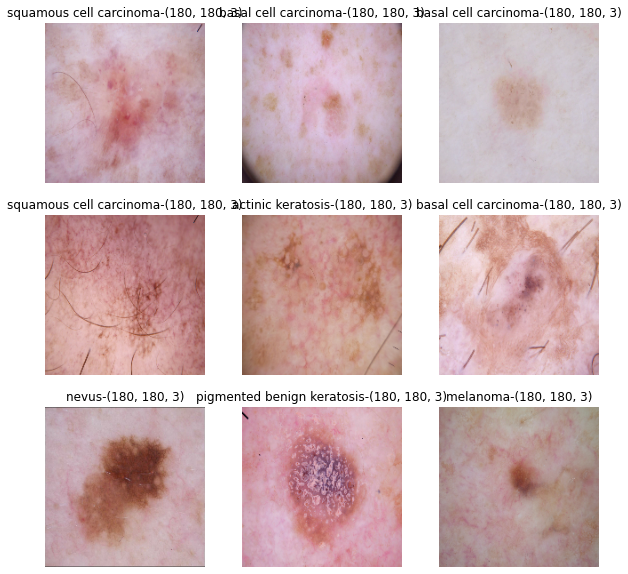

In [ ]:
# view image to see outout of generator 
image_plot(train_ds,class_names)

##### Resizing, Scaling, Normalization

In [ ]:
# doing normalization along with model , attaching it with layers
# checking label and image tensor after prepare 
for images, labels in train_ds.take(1):
 # Notice the pixel values are now in `[0,1]`.
  print(np.min(images[0]), np.max(images[0]))
  print(labels)

### Model Architecture

In [6]:
# function to make model
def make_model(input_shape, num_classes, dropout=None,is_residual_block=False):

    def cn_bn_relu(inputs,filters,kernel_size,dropout=None) :
      x = layers.SeparableConv2D(filters=filters,kernel_size=kernel_size, padding="same")(inputs)
      x = layers.BatchNormalization()(x)
      if dropout :
        x = layers.Dropout(dropout)(x)
      x = layers.Activation("relu")(x)
      return x

    def preprocess_layers(inputs) :
      x = layers.Rescaling(1.0 / 255)(inputs)
      return x

    inputs = tf.keras.Input(shape=input_shape)
    # Entry block
    x=preprocess_layers(inputs)
    x=cn_bn_relu(x,filters=64,kernel_size=3)

    previous_block_activation = x  # Set aside residual

    for filter in [128,256,512]:
        x=cn_bn_relu(x,filters=filter,kernel_size=3,dropout=dropout)
        x=cn_bn_relu(x,filters=filter,kernel_size=3,dropout=dropout)
        x=cn_bn_relu(x,filters=filter,kernel_size=3)
    
        x = layers.MaxPooling2D(pool_size=2)(x)
        
        # residual
        if is_residual_block :
          if filter < 512 :
            residual = layers.Conv2D(filters=filter,strides=2,kernel_size=1, padding="same",activation="relu")(previous_block_activation)
            x = layers.BatchNormalization()(x)
           
            x = layers.Activation("relu")(x)
          else :
            residual = layers.Conv2D(filters=filter,strides=2,kernel_size=2, padding="valid",activation="relu")(previous_block_activation)
            x = layers.BatchNormalization()(x)
            x = layers.Activation("relu")(x)
          x = layers.add([x, residual]) 
          previous_block_activation = x 

    x=cn_bn_relu(x,filters=728,kernel_size=3)

    x = layers.Flatten()(x)
    
    x = layers.Dense(256)(x)
    x = layers.BatchNormalization()(x)
    if dropout :
      x = layers.Dropout(dropout)(x)
    
    x = layers.Activation("relu")(x)
      
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    return tf.keras.Model(inputs, outputs)

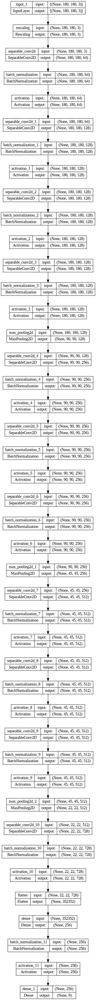

In [ ]:
model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9)
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 separable_conv2d (Separable  (None, 180, 180, 64)     283       
 Conv2D)                                                         
                                                                 
 batch_normalization (BatchN  (None, 180, 180, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 180, 180, 64)      0         
                                                                 
 separable_conv2d_1 (Separab  (None, 180, 180, 128)    8896  

#### ablation run to test model architecutre 

In [ ]:
model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam(1e-3)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

In [ ]:
# architecture testing with small dataset
tr_ds = train_ds.take(4)
vr_ds = val_ds.take(1)

In [ ]:
epochs = 5

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model.compile(
    optimizer=optimizer,
    loss=loss_object,
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy()],
)
model.fit(
    tr_ds,
    epochs=epochs,
    #callbacks=callbacks,
    validation_data=vr_ds,
)

Epoch 1/5
4/4 [==============================] - 58s 11s/step - loss: 3.0984 - sparse_categorical_accuracy: 0.2344 - val_loss: 2.1697 - val_sparse_categorical_accuracy: 0.2500
Epoch 2/5
4/4 [==============================] - 8s 2s/step - loss: 2.2243 - sparse_categorical_accuracy: 0.3516 - val_loss: 2.2401 - val_sparse_categorical_accuracy: 0.0625
Epoch 3/5
4/4 [==============================] - 11s 3s/step - loss: 1.7995 - sparse_categorical_accuracy: 0.4453 - val_loss: 2.2237 - val_sparse_categorical_accuracy: 0.1562
Epoch 4/5
4/4 [==============================] - 8s 2s/step - loss: 1.6551 - sparse_categorical_accuracy: 0.4219 - val_loss: 2.1481 - val_sparse_categorical_accuracy: 0.2188
Epoch 5/5
4/4 [==============================] - 8s 2s/step - loss: 1.5231 - sparse_categorical_accuracy: 0.4609 - val_loss: 2.2642 - val_sparse_categorical_accuracy: 0.1250


#### Chekcing stability of Learning Rate with small sample dataset

In [ ]:
# range of learning rates to tune
hyper_parameters_for_lr = [0.1, 0.01, 0.001,0.0001]

# callback to append loss
class LossHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))

# instantiate a LossHistory() object to store histories

plot_data = {}

# for each hyperparam: train the model and plot loss history
for lr in hyper_parameters_for_lr:
    history = LossHistory()
    print ('\n\n'+'=='*20 + '   Checking for LR={}  '.format(lr) + '=='*20 )
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy()

    adam = tf.keras.optimizers.Adam(learning_rate=lr)
    
    # model and generators
    model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9)

    model.compile(
    optimizer=adam,
    loss=loss_object,
    metrics=[tf.keras.metrics.SparseCategoricalAccuracy()]
    )

    model.fit(
    tr_ds,
    epochs=epochs,
    callbacks=[history],
    validation_data=vr_ds,
    )
    
    # store loss history
    plot_data[lr] = history.losses



========================================   Checking for LR=0.1  ========================================
Epoch 1/5
4/4 [==============================] - 16s 2s/step - loss: 5.0232 - sparse_categorical_accuracy: 0.1719 - val_loss: 3240322662400.0000 - val_sparse_categorical_accuracy: 0.1250
Epoch 2/5
3/4 [=====================>........] - ETA: 0s - loss: 3.2067 - sparse_categorical_accuracy: 0.1979

4/4 [==============================] - 7s 2s/step - loss: 3.4164 - sparse_categorical_accuracy: 0.1641 - val_loss: 335544418304.0000 - val_sparse_categorical_accuracy: 0.1250
Epoch 3/5
4/4 [==============================] - 10s 3s/step - loss: 2.8800 - sparse_categorical_accuracy: 0.2266 - val_loss: 15918516224.0000 - val_sparse_categorical_accuracy: 0.1875
Epoch 4/5
4/4 [==============================] - 7s 2s/step - loss: 2.0666 - sparse_categorical_accuracy: 0.2969 - val_loss: 1551453696.0000 - val_sparse_categorical_accuracy: 0.1250
Epoch 5/5
4/4 [==============================] - 7s 2s/step - loss: 2.2686 - sparse_categorical_accuracy: 0.2109 - val_loss: 422362912.0000 - val_sparse_categorical_accuracy: 0.1250


========================================   Checking for LR=0.01  ========================================
Epoch 1/5
4/4 [==============================] - 17s 2s/step - loss: 3.0917 - sparse_categorical_accuracy: 0.1797 - val_loss: 2.3400 - val_sparse_categorical_accuracy:

4/4 [==============================] - 7s 2s/step - loss: 2.3365 - sparse_categorical_accuracy: 0.2812 - val_loss: 2.1347 - val_sparse_categorical_accuracy: 0.0312
Epoch 3/5
4/4 [==============================] - 7s 2s/step - loss: 2.0285 - sparse_categorical_accuracy: 0.3594 - val_loss: 2.1431 - val_sparse_categorical_accuracy: 0.2812
Epoch 4/5
4/4 [==============================] - 8s 2s/step - loss: 1.7399 - sparse_categorical_accuracy: 0.3750 - val_loss: 2.1545 - val_sparse_categorical_accuracy: 0.2188
Epoch 5/5
4/4 [==============================] - 9s 2s/step - loss: 1.7552 - sparse_categorical_accuracy: 0.3984 - val_loss: 2.1413 - val_sparse_categorical_accuracy: 0.1875


========================================   Checking for LR=0.001  ========================================
Epoch 1/5
4/4 [==============================] - 16s 2s/step - loss: 2.6159 - sparse_categorical_accuracy: 0.2031 - val_loss: 2.1778 - val_sparse_categorical_accuracy: 0.1562
Epoch 2/5
3/4 [===============

4/4 [==============================] - 8s 2s/step - loss: 2.0872 - sparse_categorical_accuracy: 0.4219 - val_loss: 2.0857 - val_sparse_categorical_accuracy: 0.2188
Epoch 3/5
4/4 [==============================] - 10s 3s/step - loss: 1.7336 - sparse_categorical_accuracy: 0.5000 - val_loss: 2.3363 - val_sparse_categorical_accuracy: 0.1250
Epoch 4/5
4/4 [==============================] - 7s 2s/step - loss: 1.4238 - sparse_categorical_accuracy: 0.5469 - val_loss: 2.2045 - val_sparse_categorical_accuracy: 0.2188
Epoch 5/5
4/4 [==============================] - 7s 2s/step - loss: 1.0997 - sparse_categorical_accuracy: 0.6328 - val_loss: 2.2303 - val_sparse_categorical_accuracy: 0.2500


========================================   Checking for LR=0.0001  ========================================
Epoch 1/5
4/4 [==============================] - 17s 2s/step - loss: 2.7940 - sparse_categorical_accuracy: 0.1953 - val_loss: 2.2016 - val_sparse_categorical_accuracy: 0.1562
Epoch 2/5
3/4 [=============

4/4 [==============================] - 10s 3s/step - loss: 1.6899 - sparse_categorical_accuracy: 0.4609 - val_loss: 2.2008 - val_sparse_categorical_accuracy: 0.0625
Epoch 3/5
4/4 [==============================] - 7s 2s/step - loss: 1.1893 - sparse_categorical_accuracy: 0.6172 - val_loss: 2.1655 - val_sparse_categorical_accuracy: 0.0625
Epoch 4/5
4/4 [==============================] - 7s 2s/step - loss: 0.8683 - sparse_categorical_accuracy: 0.7656 - val_loss: 2.1654 - val_sparse_categorical_accuracy: 0.0938
Epoch 5/5
4/4 [==============================] - 8s 2s/step - loss: 0.7834 - sparse_categorical_accuracy: 0.8359 - val_loss: 2.1753 - val_sparse_categorical_accuracy: 0.0000e+00


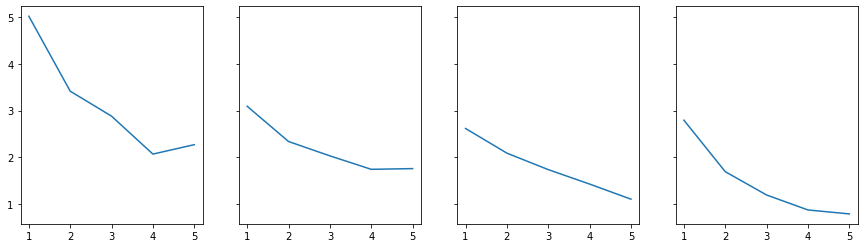

In [ ]:
# plot loss history for each value of hyperparameter
f, axes = plt.subplots(1, 4, sharey=True)
f.set_figwidth(15)

plt.setp(axes, xticks=np.arange(0, len(plot_data[0.01]), 1)+1)

for i, lr in enumerate(plot_data.keys()):
  axes[i].plot(np.arange(len(plot_data[lr]))+1, plot_data[lr])

as per experiment , we can start with 0.0001 learning rate

Exprement-1 : Running without augmentation with 20 epoch :

In [ ]:
model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam(1e-4)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

In [ ]:
epochs = 20

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model.compile(
    optimizer=optimizer,
    loss=loss_object,
    metrics=[train_accuracy],
)
model.fit(
    train_ds,
    epochs=epochs,
    #callbacks=callbacks,
    validation_data=val_ds,
)

Epoch 1/20
56/56 [==============================] - 160s 3s/step - loss: 1.9421 - train_accuracy: 0.3845 - val_loss: 2.1368 - val_train_accuracy: 0.2125
Epoch 2/20
56/56 [==============================] - 56s 961ms/step - loss: 1.0902 - train_accuracy: 0.6384 - val_loss: 2.1785 - val_train_accuracy: 0.2125
Epoch 3/20
56/56 [==============================] - 54s 944ms/step - loss: 0.6139 - train_accuracy: 0.8276 - val_loss: 2.2899 - val_train_accuracy: 0.0403
Epoch 4/20
56/56 [==============================] - 54s 933ms/step - loss: 0.3590 - train_accuracy: 0.9107 - val_loss: 2.4180 - val_train_accuracy: 0.0403
Epoch 5/20
56/56 [==============================] - 53s 912ms/step - loss: 0.3096 - train_accuracy: 0.9157 - val_loss: 2.4750 - val_train_accuracy: 0.0403
Epoch 6/20
56/56 [==============================] - 53s 924ms/step - loss: 0.2359 - train_accuracy: 0.9230 - val_loss: 2.3661 - val_train_accuracy: 0.1588
Epoch 7/20
56/56 [==============================] - 53s 925ms/step - los

Observation : 
There is a huge gap b/w accuracy of train and validation. It means model is suffering from overfit where it is trying to mug up all datapoint but it is not generalizing well.

### Generating Augmented Data 

In [ ]:
!pip install Augmentor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
training_ds_path=f"{root}/Train"
import Augmentor
for i in class_names:
    print(training_ds_path + i)
    p = Augmentor.Pipeline(training_ds_path +"/"+i)
    p.scale(probability=0.5,scale_factor=1.2)
    p.rotate(probability=0.5, max_left_rotation=10, max_right_rotation=10)
    p.flip_left_right(probability=0.4)
    # Now we add a vertical flip operation to the pipeline:
    p.flip_top_bottom(probability=0.5)
    p.zoom(probability=0.5, min_factor=1.1, max_factor=1.5)
    p.skew(probability=0.5)
    p.shear(probability=0.5,max_shear_left=10,max_shear_right=10)
    p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.
     

/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainactinic keratosis
Initialised with 114 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/actinic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=720x540 at 0x7FC1A4415DF0>: 100%|██████████| 500/500 [00:39<00:00, 12.51 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainbasal cell carcinoma
Initialised with 376 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/basal cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=720x540 at 0x7FC1A43D65E0>: 100%|██████████| 500/500 [00:41<00:00, 12.19 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Traindermatofibroma
Initialised with 95 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/dermatofibroma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FC1A43CD4C0>: 100%|██████████| 500/500 [00:44<00:00, 11.14 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainmelanoma
Initialised with 438 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/melanoma/output.

Processing <PIL.Image.Image image mode=RGB size=2457x1843 at 0x7FC1A43EC580>: 100%|██████████| 500/500 [03:22<00:00,  2.46 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainnevus
Initialised with 357 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/nevus/output.

Processing <PIL.Image.Image image mode=RGB size=767x576 at 0x7FC1A43A0C10>: 100%|██████████| 500/500 [03:19<00:00,  2.51 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainpigmented benign keratosis
Initialised with 462 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/pigmented benign keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FC1A43B1AF0>: 100%|██████████| 500/500 [00:40<00:00, 12.41 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainseborrheic keratosis
Initialised with 77 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/seborrheic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7FC1A43D8460>: 100%|██████████| 500/500 [01:39<00:00,  5.05 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainsquamous cell carcinoma
Initialised with 181 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/squamous cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=720x540 at 0x7FC1A43D8F70>: 100%|██████████| 500/500 [00:41<00:00, 12.00 Samples/s]


/content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Trainvascular lesion
Initialised with 139 image(s) found.
Output directory set to /content/drive/MyDrive/AI_ML_CLass/Data/Melanoma-Detection/skin_cancer_isic_augmented/Train/vascular lesion/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FC1A44637C0>: 100%|██████████| 500/500 [00:40<00:00, 12.38 Samples/s]


#### Checking Distribution after Augmentation

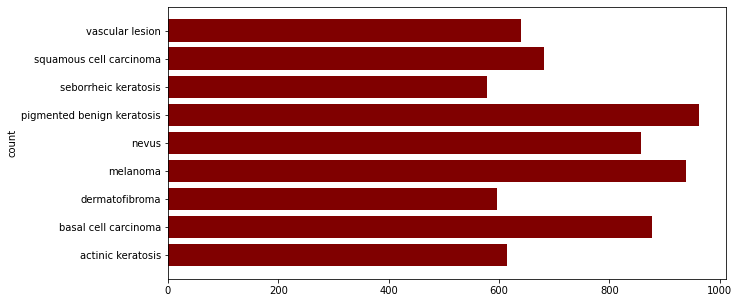

In [ ]:
## class-wise count
count_bin = []
for cls in cls_names :
  count_bin.append(len(os.listdir(f"Train/{cls}/"))+len(os.listdir(f"Train/{cls}/output/")))

fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.barh(cls_names,count_bin, color ='maroon')
plt.ylabel("count")
plt.show()

### Image Generator After Augmentation

In [8]:
## new train set
train_ds=tf.keras.utils.image_dataset_from_directory(
    directory=f"{root}/Train/",
    label_mode='int',
    class_names=class_names,
    color_mode='rgb',
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="training",
    interpolation='bilinear',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

Found 6739 files belonging to 9 classes.
Using 5392 files for training.


In [9]:
# new validation set
val_ds=tf.keras.utils.image_dataset_from_directory(
    directory=f"{root}/Train/",
    label_mode='int',
    class_names=class_names,
    color_mode='rgb',
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="validation",
    interpolation='bilinear',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


#### Experiment-2 : Running The same model after augmentation

In [10]:
model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam(1e-4)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

In [11]:
epochs = 30

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model.compile(
    optimizer=optimizer,
    loss=loss_object,
    metrics=[train_accuracy],
)
model_hist = model.fit(
    train_ds,
    epochs=epochs,
    #callbacks=callbacks,
    validation_data=val_ds,
)

## early stopped due to overfit problem

Epoch 1/30
169/169 [==============================] - 173s 922ms/step - loss: 1.6298 - train_accuracy: 0.4199 - val_loss: 2.6643 - val_train_accuracy: 0.1381
Epoch 2/30
 36/169 [=====>........................] - ETA: 1:51 - loss: 1.0761 - train_accuracy: 0.6163

KeyboardInterrupt: ignored

Observation : Model is still facing overfit problem. It is clearly visible here that only applying augmentation is not helping to reduce overfit problem.

#### Experiment-3 : Running The same model (augmentation + Dropout)

In [11]:
model = make_model(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9,dropout=0.40)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam(1e-4)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

In [ ]:
epochs = 30

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model.compile(
    optimizer=optimizer,
    loss=loss_object,
    metrics=[train_accuracy],
)
model_hist = model.fit(
    train_ds,
    epochs=epochs,
    #callbacks=callbacks,
    validation_data=val_ds,
)

Epoch 1/30
 45/169 [======>.......................] - ETA: 2:29 - loss: 2.5197 - train_accuracy: 0.1437

#### Experiment With Changing Network 

In [ ]:
# function to make model
def make_model_experiment2(input_shape, num_classes, dropout=None,is_residual_block=False):

    def cn_bn_relu(inputs,filters,kernel_size,dropout=None) :
      x = layers.SeparableConv2D(filters=filters,kernel_size=kernel_size, padding="same")(inputs)
      x = layers.BatchNormalization()(x)
      if dropout :
        x = layers.Dropout(dropout)(x)
      x = layers.Activation("relu")(x)
      return x

    def preprocess_layers(inputs) :
      x = layers.Rescaling(1.0 / 255)(inputs)
      return x

    inputs = tf.keras.Input(shape=input_shape)
    # Entry block
    x=preprocess_layers(inputs)
    x=cn_bn_relu(x,filters=64,kernel_size=3)

    previous_block_activation = x  # Set aside residual

    for filter in [128,256,512]:
        x=cn_bn_relu(x,filters=filter,kernel_size=3,dropout=dropout)
        x=cn_bn_relu(x,filters=filter,kernel_size=3,dropout=dropout)
        x=cn_bn_relu(x,filters=filter,kernel_size=3)
    
        x = layers.MaxPooling2D(pool_size=2)(x)
        
        # residual
        if is_residual_block :
          if filter < 512 :
            residual = layers.Conv2D(filters=filter,strides=2,kernel_size=1, padding="same",activation="relu")(previous_block_activation)
            x = layers.BatchNormalization()(x)
           
            x = layers.Activation("relu")(x)
          else :
            residual = layers.Conv2D(filters=filter,strides=2,kernel_size=2, padding="valid",activation="relu")(previous_block_activation)
            x = layers.BatchNormalization()(x)
            x = layers.Activation("relu")(x)
          x = layers.add([x, residual]) 
          previous_block_activation = x 

    x=cn_bn_relu(x,filters=728,kernel_size=3)

    x = layers.Flatten()(x)
    
    x = layers.Dense(256)(x)
    x = layers.BatchNormalization()(x)
    if dropout :
      x = layers.Dropout(dropout)(x)
    
    x = layers.Activation("relu")(x)
      
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    return tf.keras.Model(inputs, outputs)

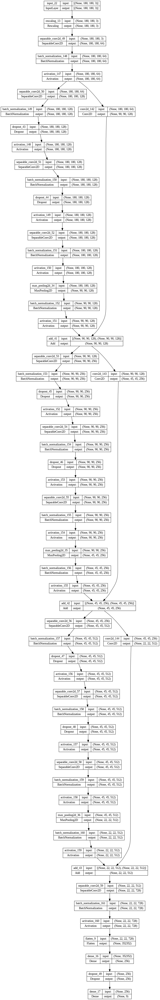

In [ ]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model = make_model_experiment2(input_shape=(IMG_SIZE, IMG_SIZE)+(NUMBER_OF_CHANNEL,), num_classes=9,is_residual_block=True,dropout=0.2)
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_13 (Rescaling)       (None, 180, 180, 3)  0           ['input_22[0][0]']               
                                                                                                  
 separable_conv2d_49 (Separable  (None, 180, 180, 64  283        ['rescaling_13[0][0]']           
 Conv2D)                        )                                                                 
                                                                                           

In [ ]:
data_augmentation = tf.keras.Sequential([
      layers.RandomFlip("horizontal_and_vertical"),
      layers.RandomRotation(0.2),
      layers.RandomZoom(.2, .2)
      layes.Random
    ])
tf.keras.metrics.SparseCategoricalAccuracy()

In [ ]:
epochs = 30

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model.compile(
    optimizer=adam,
    loss=loss_object,
    metrics=["accuracy"],
)
model.fit(
    train_ds,
    epochs=epochs,
    #callbacks=callbacks,
    validation_data=val_ds,
)

Epoch 1/30
169/169 [==============================] - 222s 1s/step - loss: 682.4614 - accuracy: 0.1345 - val_loss: 113.1783 - val_accuracy: 0.1180
Epoch 2/30
169/169 [==============================] - 217s 1s/step - loss: 2.1882 - accuracy: 0.1328 - val_loss: 2.1982 - val_accuracy: 0.1381
Epoch 3/30
166/169 [============================>.] - ETA: 3s - loss: 2.1985 - accuracy: 0.1337

#### Research Based network run :

In [ ]:

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

test_loss = tf.keras.metrics.Mean(name='val_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='val_accuracy')

In [ ]:
@tf.function
def train_step(images, labels):
  with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    predictions = model(images, training=True)
    loss = loss_object(labels, predictions)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

  train_loss(loss)
  train_accuracy(labels, predictions)

In [ ]:
@tf.function
def test_step(images, labels):
  # training=False is only needed if there are layers with different
  # behavior during training versus inference (e.g. Dropout).
  
  predictions = model(images, training=False)
  t_loss = loss_object(labels, predictions)

  test_loss(t_loss)
  test_accuracy(labels, predictions)

In [ ]:
# ablation run
EPOCHS = 5

for epoch in range(EPOCHS):
  # Reset the metrics at the start of the next epoch
  train_loss.reset_states()
  train_accuracy.reset_states()
  test_loss.reset_states()
  test_accuracy.reset_states()

  for images, labels in train_ds.take(3):
    train_step(images, labels)

  for test_images, test_labels in test_ds.take(2):
    test_step(test_images, test_labels)

  print(
    f'Epoch {epoch + 1}, '
    f'Loss: {train_loss.result()}, '
    f'Accuracy: {train_accuracy.result() * 100}, '
    f'Test Loss: {test_loss.result()}, '
    f'Test Accuracy: {test_accuracy.result() * 100}'
  )

Epoch 1, Loss: 2.1882474422454834, Accuracy: 22.916667938232422, Test Loss: 2.204775333404541, Test Accuracy: 25.0
Epoch 2, Loss: 2.168569326400757, Accuracy: 28.125, Test Loss: 2.2105531692504883, Test Accuracy: 25.0
Epoch 3, Loss: 2.155147075653076, Accuracy: 28.125, Test Loss: 2.2109456062316895, Test Accuracy: 25.0
Epoch 4, Loss: 2.1579806804656982, Accuracy: 22.916667938232422, Test Loss: 2.203650951385498, Test Accuracy: 17.1875
Epoch 5, Loss: 2.156289577484131, Accuracy: 13.541666984558105, Test Loss: 2.17569637298584, Test Accuracy: 6.25
